In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
    print(os.path.join(dirname))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input
/kaggle/input/gan-getting-started
/kaggle/input/gan-getting-started/monet_jpg
/kaggle/input/gan-getting-started/photo_tfrec
/kaggle/input/gan-getting-started/photo_jpg
/kaggle/input/gan-getting-started/monet_tfrec


In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
import matplotlib.pyplot as plt
from PIL import Image

# Data Extraction

In [3]:
import os
from PIL import Image
from torch.utils.data import Dataset

class TorchDataset(Dataset):
    def __init__(self, data_path, transform=None, file_extensions=['.jpg', '.png']):
        """
        Initialize the dataset with the path to the images and any optional transformations.
        
        Args:
            data_path (str): Directory containing image files.
            transform (callable, optional): Optional transformations to apply to images.
            file_extensions (list, optional): List of allowed image file extensions.
        """
        self.data_path = data_path
        self.transform = transform
        self.file_extensions = file_extensions
        # Filter image paths based on allowed file extensions
        self.image_paths = [os.path.join(data_path, file) for file in os.listdir(data_path) 
                            if any(file.endswith(ext) for ext in file_extensions)]

        # Ensure there are valid images in the directory
        if len(self.image_paths) == 0:
            raise ValueError(f"No valid image files found in directory {data_path}.")

    def __len__(self):
        """Return the total number of images."""
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        Load and return an image from the dataset at the given index.
        
        Args:
            idx (int): Index of the image.
        
        Returns:
            Tensor: Transformed image tensor.
        """
        img_path = self.image_paths[idx]
        try:
            # Open image and convert to RGB format
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            raise RuntimeError(f"Error loading image {img_path}: {e}")

        # Apply the specified transform, if any
        if self.transform:
            image = self.transform(image)

        return image


In [4]:
# Define image transformations with flexibility in size
def get_transforms(resize=(256, 256), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)):
    """
    Function to get image transforms.
    
    Args:
        resize (tuple): Target size for resizing the image (width, height).
        mean (tuple): Mean for normalization of the image.
        std (tuple): Standard deviation for normalization.
    
    Returns:
        transforms.Compose: Composed image transformations.
    """
    return torchvision.transforms.Compose([
        torchvision.transforms.Resize(resize),  # Resize to given dimensions
        torchvision.transforms.ToTensor(),  # Convert image to tensor
        torchvision.transforms.Normalize(mean, std)  # Normalize with given mean and std
    ])

# Example usage
transforms = get_transforms(resize=(256, 256), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))

In [5]:
transforms = torchvision.transforms.Compose([
    torchvision.transforms.Resize((256,256)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [6]:
MonetDataset = TorchDataset(data_path='/kaggle/input/gan-getting-started/monet_jpg', transform=transforms)
PhotoDataset = TorchDataset(data_path='/kaggle/input/gan-getting-started/photo_jpg', transform=transforms)

# Adjusted DataLoader parameters for better performance
MonetLoader = DataLoader(MonetDataset, batch_size=32, shuffle=True, num_workers=4)
PhotoLoader = DataLoader(PhotoDataset, batch_size=32, shuffle=True, num_workers=4)

# EDA

In [7]:
print(len(PhotoDataset), len(MonetDataset))

7038 300


In [8]:
monets = next(iter(MonetLoader))
photos = next(iter(PhotoLoader))
print(monets.shape, photos.shape)

torch.Size([32, 3, 256, 256]) torch.Size([32, 3, 256, 256])


In [9]:
# tansform data to be readable by plt.imshow
monets_imshow = []
for monet in monets:
    monet = monet.permute(1, 2, 0) 
    monet = monet.numpy() 
    monet = monet * 0.5 + 0.5 
    monets_imshow.append(monet)

photos_imshow = []    
for photo in photos:
    photo = photo.permute(1, 2, 0) 
    photo = photo.numpy()
    photo = photo * 0.5 + 0.5
    photos_imshow.append(photo)

(256, 256, 3)
float32
Monet Images


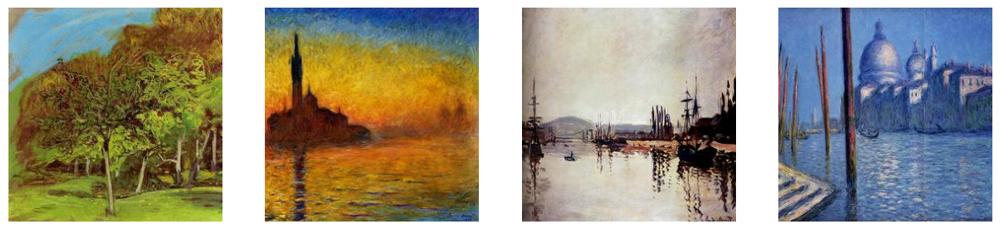

Photo Images


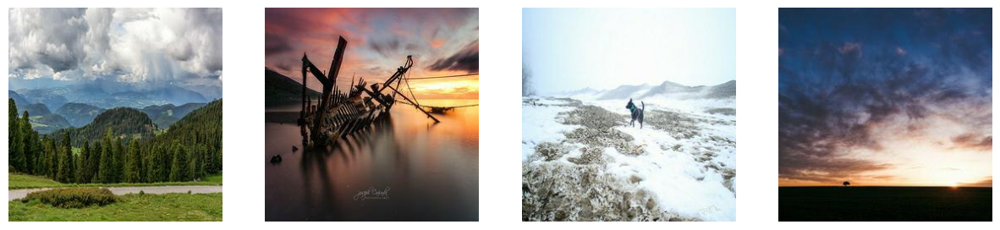

In [10]:
# Print the shape and data type of the fourth Monet image
print(monets_imshow[3].shape)  # Output: (256, 256, 3)
print(monets_imshow[3].dtype)  # Output: float32

# Display the first 4 Monet images
print('Monet Images')
plt.figure(figsize=(15, 5))
for i in range(4):
    plt.subplot(1, 4, i + 1)  # Create a 1x4 grid and plot each image
    plt.imshow(monets_imshow[i])
    plt.axis('off')  # Remove axes for a cleaner display
plt.show()

# Display the first 4 Photo images
print('Photo Images')
plt.figure(figsize=(15, 5))
for i in range(4):
    plt.subplot(1, 4, i + 1)  # Create a 1x4 grid and plot each image
    plt.imshow(photos_imshow[i])
    plt.axis('off')  # Remove axes for a cleaner display
plt.show()

In [11]:
print(monets_imshow[3].shape) 
print(monets_imshow[3].dtype) 

(256, 256, 3)
float32


# Discriminator

In [12]:
import torch.nn as nn

class Block(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super(Block, self).__init__()
        self.cnn = nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=4,
                stride=stride,
                padding=1,
                bias=True,
                padding_mode="reflect",  # Padding using reflection for better edge consistency
            ),
            nn.InstanceNorm2d(out_channels),  # Instance normalization for better batch independence
            nn.LeakyReLU(0.2, inplace=True),  # Leaky ReLU to prevent dead neurons
        )

    def forward(self, x):
        return self.cnn(x)

In [13]:
import torch
import torch.nn as nn

class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super(Discriminator, self).__init__()
        
        # Initial convolution layer (no instance normalization in the first layer as per common practice in GANs)
        self.initial = nn.Sequential(
            nn.Conv2d(
                in_channels,
                features[0],
                kernel_size=4,
                stride=2,  # Stride of 2 to downsample the input
                padding=1,
                padding_mode="reflect",  # Reflection padding to handle borders better
            ),
            nn.LeakyReLU(0.2, inplace=True),  # Leaky ReLU activation
        )

        # Create a list to hold the intermediate layers
        layers = []
        in_channels = features[0]

        # Add intermediate convolution blocks using the Block class
        for feature in features[1:]:
            # If it's the last feature, use stride=1 to avoid further downsampling
            stride = 1 if feature == features[-1] else 2
            layers.append(
                Block(in_channels, feature, stride)
            )
            in_channels = feature  # Update in_channels for the next layer

        # Add the final layer, outputting a single channel (real/fake score map)
        layers.append(
            nn.Conv2d(
                in_channels,
                1,  # Output a single feature map (real or fake classification score)
                kernel_size=4,
                stride=1,
                padding=1,
                padding_mode="reflect",
            )
        )

        # Combine all the layers into a sequential model
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        # Pass the input through the initial layer
        x = self.initial(x)
        
        # Pass through the remaining layers and apply a sigmoid to the output
        return torch.sigmoid(self.model(x))

In [14]:
model_dis_test = Discriminator()  # Create an instance of the Discriminator

test_input = torch.randn((2, 3, 256, 256))  # Create a batch of 2 images, each with 3 channels (RGB) and 256x256 resolution

print(model_dis_test(test_input).shape)  # Print the output shape after passing the input through the model

torch.Size([2, 1, 30, 30])


# Generator Code with CNN and Residual Blocks:

In [15]:
import torch.nn as nn

class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super(CNNBlock, self).__init__()

        # Convolutional layer: Downsampling with Conv2D or Upsampling with ConvTranspose2D
        if down:
            conv_layer = nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)  # Downsample using Conv2D
        else:
            conv_layer = nn.ConvTranspose2d(in_channels, out_channels, **kwargs)  # Upsample using ConvTranspose2D

        # Optional activation layer (ReLU for default, Identity for no activation)
        if use_act:
            act_layer = nn.ReLU(inplace=True)  # Inplace saves memory
        else:
            act_layer = nn.Identity()  # Identity is used when no activation is needed

        # Sequentially combine the convolution, instance normalization, and activation
        self.cnn = nn.Sequential(
            conv_layer,
            nn.InstanceNorm2d(out_channels),  # Instance normalization for batch independence
            act_layer,
        )

    def forward(self, x):
        return self.cnn(x)

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()

        # A residual block consists of two CNN blocks with identical input/output channels
        self.block = nn.Sequential(
            CNNBlock(channels, channels, kernel_size=3, padding=1),  # First convolution block
            CNNBlock(channels, channels, use_act=False, kernel_size=3, padding=1),  # Second block without activation
        )

    def forward(self, x):
        # Return the sum of the input (skip connection) and the processed block
        return x + self.block(x)

In [16]:
import torch
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, img_channels, num_features=64, num_residuals=9):
        super(Generator, self).__init__()

        # Initial convolutional layer with 7x7 kernel (common in style transfer and GANs)
        self.initial = nn.Sequential(
            nn.Conv2d(
                img_channels,
                num_features,
                kernel_size=7,
                stride=1,
                padding=3,
                padding_mode="reflect",  # Reflection padding to preserve edge details
            ),
            nn.InstanceNorm2d(num_features),  # Normalize feature maps for style transfer
            nn.ReLU(inplace=True),  # Inplace for memory efficiency
        )

        # Downsampling layers (reduce spatial resolution)
        self.down_blocks = nn.ModuleList([
            CNNBlock(
                num_features,
                num_features * 2,
                kernel_size=3,
                stride=2,  # Stride of 2 for downsampling
                padding=1,
            ),
            CNNBlock(
                num_features * 2,
                num_features * 4,
                kernel_size=3,
                stride=2,  # Further downsampling
                padding=1,
            ),
        ])

        # Residual blocks (apply transformations without changing resolution)
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(num_features * 4) for _ in range(num_residuals)]  # Stacking residual blocks
        )

        # Upsampling layers (increase spatial resolution)
        self.up_blocks = nn.ModuleList([
            CNNBlock(
                num_features * 4,
                num_features * 2,
                down=False,  # Use ConvTranspose2d for upsampling
                kernel_size=3,
                stride=2,
                padding=1,
                output_padding=1,  # To adjust the output size
            ),
            CNNBlock(
                num_features * 2,
                num_features * 1,
                down=False,  # Another upsampling layer
                kernel_size=3,
                stride=2,
                padding=1,
                output_padding=1,
            ),
        ])

        # Final convolution layer to restore the number of image channels (RGB)
        self.last = nn.Conv2d(
            num_features * 1,
            img_channels,
            kernel_size=7,
            stride=1,
            padding=3,
            padding_mode="reflect",  # Final reflection padding to match the input size
        )

    def forward(self, x):
        # Apply the initial convolution
        x = self.initial(x)

        # Downsample the input through the downsampling blocks
        for layer in self.down_blocks:
            x = layer(x)

        # Pass through the residual blocks (maintain the resolution but apply transformations)
        x = self.res_blocks(x)

        # Upsample the feature maps to return them to the original resolution
        for layer in self.up_blocks:
            x = layer(x)

        # Apply the last convolution and return the final image with tanh activation
        return torch.tanh(self.last(x))  # Use tanh to scale the output to [-1, 1] range

In [17]:
img_channels = 3
img_size = 256

test_input = torch.randn((2, img_channels, img_size, img_size))

model_gen_test = Generator(img_channels, 9)

print(model_gen_test(test_input).shape)

torch.Size([2, 3, 256, 256])


# Training

In [18]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


In [19]:
from torch.utils.data import random_split, DataLoader

# Calculate validation size for the Monet dataset (20% of total)
val_size_monet = int(0.2 * len(MonetDataset))

# The rest of the Monet dataset will be used for training (80%)
train_size_monet = len(MonetDataset) - val_size_monet

# Calculate validation size for the Photo dataset (20% of total)
val_size_photo = int(0.2 * len(PhotoDataset))

# The rest of the Photo dataset will be used for training (80%)
train_size_photo = len(PhotoDataset) - val_size_photo

# Randomly split the Monet dataset into training and validation sets
train_MonetDataset, val_MonetDataset = random_split(MonetDataset, [train_size_monet, val_size_monet])

# Randomly split the Photo dataset into training and validation sets
train_PhotoDataset, val_PhotoDataset = random_split(PhotoDataset, [train_size_photo, val_size_photo])

# Create DataLoader for the Monet training set, with shuffling enabled (important for training)
train_MonetLoader = DataLoader(train_MonetDataset, batch_size=16, shuffle=True, num_workers=2)

# Create DataLoader for the Monet validation set, without shuffling (shuffling is not needed for validation)
val_MonetLoader = DataLoader(val_MonetDataset, batch_size=16, shuffle=False, num_workers=2)

# Create DataLoader for the Photo training set, with shuffling enabled (important for training)
train_PhotoLoader = DataLoader(train_PhotoDataset, batch_size=16, shuffle=True, num_workers=2)

# Create DataLoader for the Photo validation set, without shuffling
val_PhotoLoader = DataLoader(val_PhotoDataset, batch_size=16, shuffle=False, num_workers=2)

Epoch [1/100] - loss_G_Photo2Monet: 0.1151, loss_G_Monet2Photo: 2.5366, loss_D_Photo: 0.0102, loss_D_Monet: 0.2439
Epoch [2/100] - loss_G_Photo2Monet: 0.1074, loss_G_Monet2Photo: 2.2163, loss_D_Photo: 0.0094, loss_D_Monet: 0.2378
Epoch [3/100] - loss_G_Photo2Monet: 0.1130, loss_G_Monet2Photo: 2.3447, loss_D_Photo: 0.0087, loss_D_Monet: 0.2175
Epoch [4/100] - loss_G_Photo2Monet: 0.1141, loss_G_Monet2Photo: 2.2878, loss_D_Photo: 0.0087, loss_D_Monet: 0.2217
Epoch [5/100] - loss_G_Photo2Monet: 0.1133, loss_G_Monet2Photo: 2.3367, loss_D_Photo: 0.0080, loss_D_Monet: 0.2141
Epoch [6/100] - loss_G_Photo2Monet: 0.1086, loss_G_Monet2Photo: 2.3607, loss_D_Photo: 0.0088, loss_D_Monet: 0.2013
Epoch [7/100] - loss_G_Photo2Monet: 0.0949, loss_G_Monet2Photo: 2.0487, loss_D_Photo: 0.0099, loss_D_Monet: 0.2409
Epoch [8/100] - loss_G_Photo2Monet: 0.0877, loss_G_Monet2Photo: 2.0120, loss_D_Photo: 0.0097, loss_D_Monet: 0.2434
Epoch [9/100] - loss_G_Photo2Monet: 0.0828, loss_G_Monet2Photo: 1.9487, loss_D_P

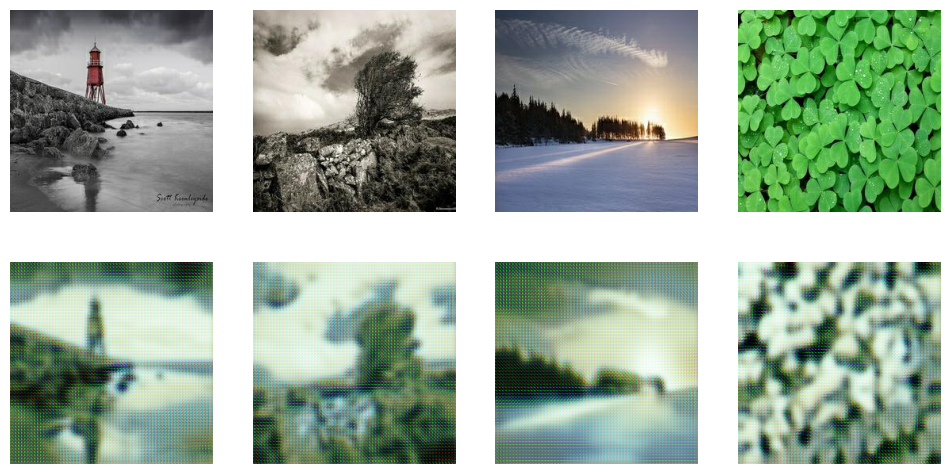

Epoch [11/100] - loss_G_Photo2Monet: 0.0853, loss_G_Monet2Photo: 1.8637, loss_D_Photo: 0.0087, loss_D_Monet: 0.2307
Epoch [12/100] - loss_G_Photo2Monet: 0.0825, loss_G_Monet2Photo: 1.8544, loss_D_Photo: 0.0088, loss_D_Monet: 0.2247
Epoch [13/100] - loss_G_Photo2Monet: 0.0808, loss_G_Monet2Photo: 1.8481, loss_D_Photo: 0.0089, loss_D_Monet: 0.2221
Epoch [14/100] - loss_G_Photo2Monet: 0.0831, loss_G_Monet2Photo: 1.8059, loss_D_Photo: 0.0088, loss_D_Monet: 0.2154
Epoch [15/100] - loss_G_Photo2Monet: 0.0801, loss_G_Monet2Photo: 1.7562, loss_D_Photo: 0.0094, loss_D_Monet: 0.2251
Epoch [16/100] - loss_G_Photo2Monet: 0.0772, loss_G_Monet2Photo: 1.7645, loss_D_Photo: 0.0094, loss_D_Monet: 0.2211
Epoch [17/100] - loss_G_Photo2Monet: 0.0766, loss_G_Monet2Photo: 1.7585, loss_D_Photo: 0.0095, loss_D_Monet: 0.2148
Epoch [18/100] - loss_G_Photo2Monet: 0.0776, loss_G_Monet2Photo: 1.7200, loss_D_Photo: 0.0092, loss_D_Monet: 0.2123
Epoch [19/100] - loss_G_Photo2Monet: 0.0787, loss_G_Monet2Photo: 1.7434,

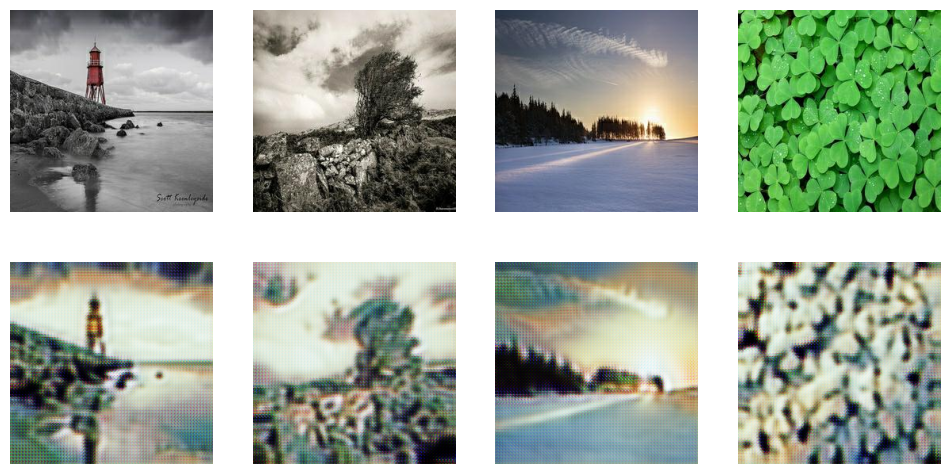

Epoch [21/100] - loss_G_Photo2Monet: 0.0790, loss_G_Monet2Photo: 1.7325, loss_D_Photo: 0.0088, loss_D_Monet: 0.2071
Epoch [22/100] - loss_G_Photo2Monet: 0.0794, loss_G_Monet2Photo: 1.7385, loss_D_Photo: 0.0093, loss_D_Monet: 0.1960
Epoch [23/100] - loss_G_Photo2Monet: 0.0754, loss_G_Monet2Photo: 1.7135, loss_D_Photo: 0.0092, loss_D_Monet: 0.1999
Epoch [24/100] - loss_G_Photo2Monet: 0.0762, loss_G_Monet2Photo: 1.7356, loss_D_Photo: 0.0090, loss_D_Monet: 0.1993
Epoch [25/100] - loss_G_Photo2Monet: 0.0744, loss_G_Monet2Photo: 1.6946, loss_D_Photo: 0.0094, loss_D_Monet: 0.2005
Epoch [26/100] - loss_G_Photo2Monet: 0.0704, loss_G_Monet2Photo: 1.7019, loss_D_Photo: 0.0093, loss_D_Monet: 0.1972
Epoch [27/100] - loss_G_Photo2Monet: 0.0770, loss_G_Monet2Photo: 1.6995, loss_D_Photo: 0.0087, loss_D_Monet: 0.1845
Epoch [28/100] - loss_G_Photo2Monet: 0.0746, loss_G_Monet2Photo: 1.7068, loss_D_Photo: 0.0094, loss_D_Monet: 0.1974
Epoch [29/100] - loss_G_Photo2Monet: 0.0746, loss_G_Monet2Photo: 1.6945,

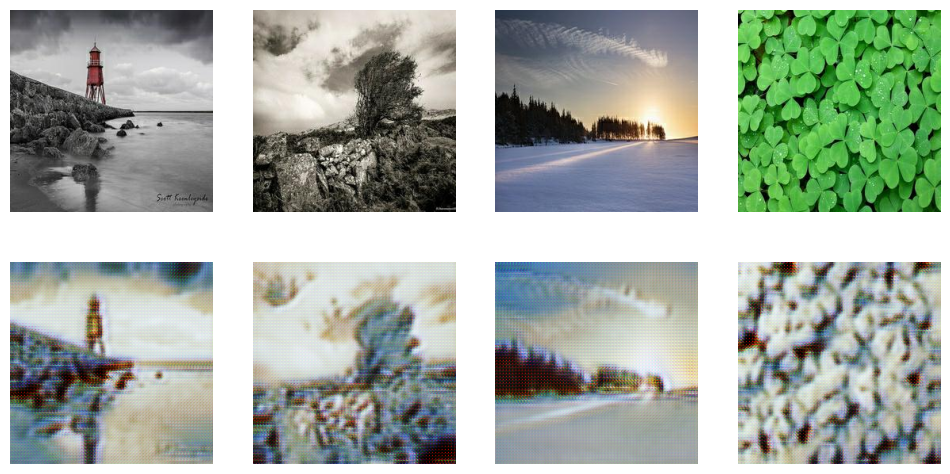

Epoch [31/100] - loss_G_Photo2Monet: 0.0736, loss_G_Monet2Photo: 1.6525, loss_D_Photo: 0.0097, loss_D_Monet: 0.1793
Epoch [32/100] - loss_G_Photo2Monet: 0.0763, loss_G_Monet2Photo: 1.6415, loss_D_Photo: 0.0091, loss_D_Monet: 0.1693
Epoch [33/100] - loss_G_Photo2Monet: 0.0750, loss_G_Monet2Photo: 1.7620, loss_D_Photo: 0.0095, loss_D_Monet: 0.2019
Epoch [34/100] - loss_G_Photo2Monet: 0.0794, loss_G_Monet2Photo: 1.8627, loss_D_Photo: 0.0084, loss_D_Monet: 0.1862
Epoch [35/100] - loss_G_Photo2Monet: 0.0733, loss_G_Monet2Photo: 1.6946, loss_D_Photo: 0.0089, loss_D_Monet: 0.1775
Epoch [36/100] - loss_G_Photo2Monet: 0.0743, loss_G_Monet2Photo: 1.7226, loss_D_Photo: 0.0088, loss_D_Monet: 0.1582
Epoch [37/100] - loss_G_Photo2Monet: 0.0728, loss_G_Monet2Photo: 1.6563, loss_D_Photo: 0.0087, loss_D_Monet: 0.1632
Epoch [38/100] - loss_G_Photo2Monet: 0.0760, loss_G_Monet2Photo: 1.6741, loss_D_Photo: 0.0090, loss_D_Monet: 0.1857
Epoch [39/100] - loss_G_Photo2Monet: 0.0789, loss_G_Monet2Photo: 1.6793,

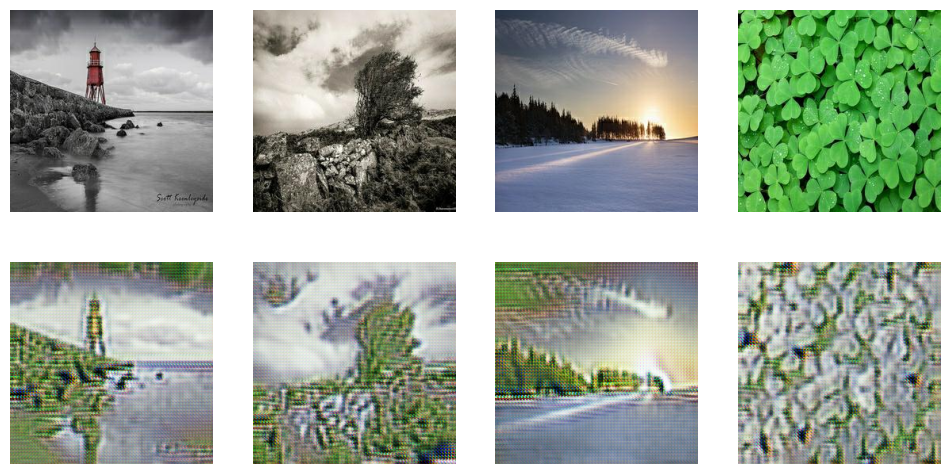

Epoch [41/100] - loss_G_Photo2Monet: 0.0738, loss_G_Monet2Photo: 1.6626, loss_D_Photo: 0.0093, loss_D_Monet: 0.1762
Epoch [42/100] - loss_G_Photo2Monet: 0.0798, loss_G_Monet2Photo: 1.6152, loss_D_Photo: 0.0087, loss_D_Monet: 0.1688
Epoch [43/100] - loss_G_Photo2Monet: 0.0804, loss_G_Monet2Photo: 1.6826, loss_D_Photo: 0.0084, loss_D_Monet: 0.1648
Epoch [44/100] - loss_G_Photo2Monet: 0.0750, loss_G_Monet2Photo: 1.6373, loss_D_Photo: 0.0090, loss_D_Monet: 0.1740
Epoch [45/100] - loss_G_Photo2Monet: 0.0727, loss_G_Monet2Photo: 1.6051, loss_D_Photo: 0.0091, loss_D_Monet: 0.1687
Epoch [46/100] - loss_G_Photo2Monet: 0.0756, loss_G_Monet2Photo: 1.5894, loss_D_Photo: 0.0089, loss_D_Monet: 0.1638
Epoch [47/100] - loss_G_Photo2Monet: 0.0758, loss_G_Monet2Photo: 1.6180, loss_D_Photo: 0.0093, loss_D_Monet: 0.1763
Epoch [48/100] - loss_G_Photo2Monet: 0.0738, loss_G_Monet2Photo: 1.6682, loss_D_Photo: 0.0089, loss_D_Monet: 0.1838
Epoch [49/100] - loss_G_Photo2Monet: 0.0803, loss_G_Monet2Photo: 1.6546,

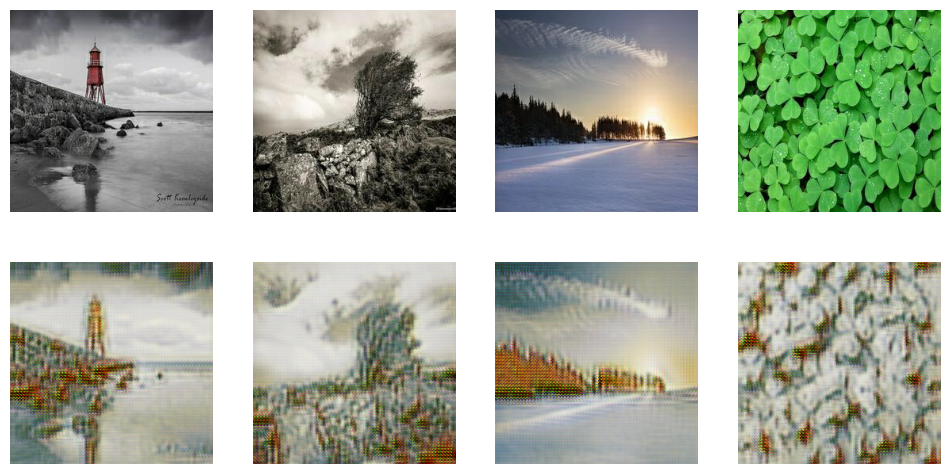

Epoch [51/100] - loss_G_Photo2Monet: 0.0766, loss_G_Monet2Photo: 1.5625, loss_D_Photo: 0.0095, loss_D_Monet: 0.1862
Epoch [52/100] - loss_G_Photo2Monet: 0.0711, loss_G_Monet2Photo: 1.5338, loss_D_Photo: 0.0099, loss_D_Monet: 0.1846
Epoch [53/100] - loss_G_Photo2Monet: 0.0726, loss_G_Monet2Photo: 1.5501, loss_D_Photo: 0.0093, loss_D_Monet: 0.1936
Epoch [54/100] - loss_G_Photo2Monet: 0.0721, loss_G_Monet2Photo: 1.4816, loss_D_Photo: 0.0100, loss_D_Monet: 0.2008
Epoch [55/100] - loss_G_Photo2Monet: 0.0694, loss_G_Monet2Photo: 1.4705, loss_D_Photo: 0.0096, loss_D_Monet: 0.2141
Epoch [56/100] - loss_G_Photo2Monet: 0.0681, loss_G_Monet2Photo: 1.4662, loss_D_Photo: 0.0101, loss_D_Monet: 0.2129
Epoch [57/100] - loss_G_Photo2Monet: 0.0712, loss_G_Monet2Photo: 1.4752, loss_D_Photo: 0.0096, loss_D_Monet: 0.1983
Epoch [58/100] - loss_G_Photo2Monet: 0.0690, loss_G_Monet2Photo: 1.4493, loss_D_Photo: 0.0096, loss_D_Monet: 0.1968
Epoch [59/100] - loss_G_Photo2Monet: 0.0694, loss_G_Monet2Photo: 1.4587,

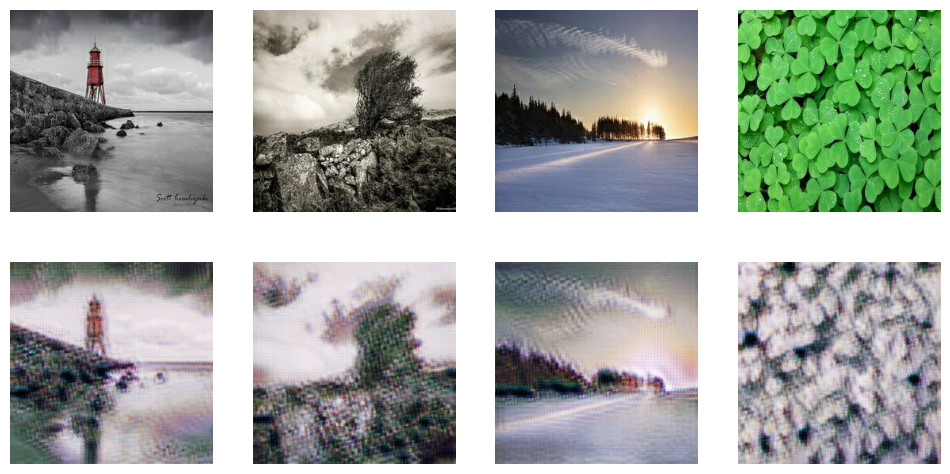

Epoch [61/100] - loss_G_Photo2Monet: 0.0678, loss_G_Monet2Photo: 1.4088, loss_D_Photo: 0.0099, loss_D_Monet: 0.2192
Epoch [62/100] - loss_G_Photo2Monet: 0.0667, loss_G_Monet2Photo: 1.3958, loss_D_Photo: 0.0099, loss_D_Monet: 0.2096
Epoch [63/100] - loss_G_Photo2Monet: 0.0682, loss_G_Monet2Photo: 1.3495, loss_D_Photo: 0.0098, loss_D_Monet: 0.2117
Epoch [64/100] - loss_G_Photo2Monet: 0.0697, loss_G_Monet2Photo: 1.3785, loss_D_Photo: 0.0099, loss_D_Monet: 0.2007
Epoch [65/100] - loss_G_Photo2Monet: 0.0670, loss_G_Monet2Photo: 1.3576, loss_D_Photo: 0.0097, loss_D_Monet: 0.2093
Epoch [66/100] - loss_G_Photo2Monet: 0.0695, loss_G_Monet2Photo: 1.4336, loss_D_Photo: 0.0093, loss_D_Monet: 0.2070
Epoch [67/100] - loss_G_Photo2Monet: 0.0690, loss_G_Monet2Photo: 1.3511, loss_D_Photo: 0.0099, loss_D_Monet: 0.2030
Epoch [68/100] - loss_G_Photo2Monet: 0.0659, loss_G_Monet2Photo: 1.3959, loss_D_Photo: 0.0096, loss_D_Monet: 0.2123
Epoch [69/100] - loss_G_Photo2Monet: 0.0723, loss_G_Monet2Photo: 1.4273,

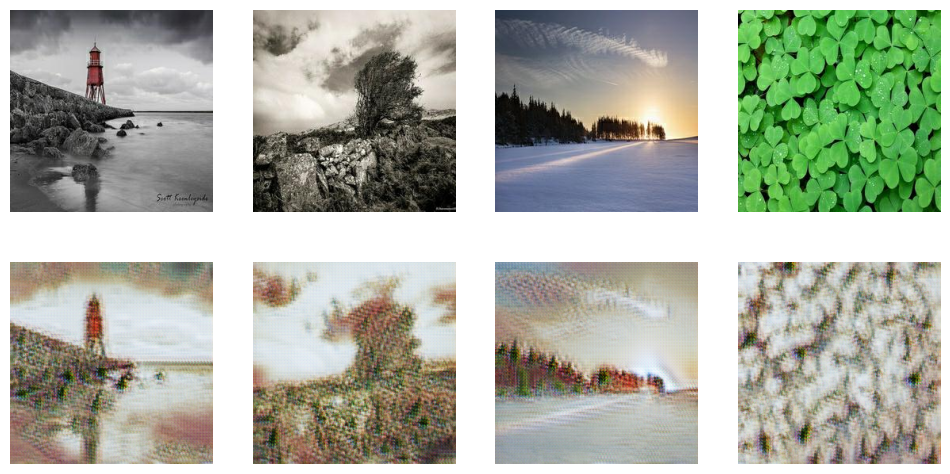

Epoch [71/100] - loss_G_Photo2Monet: 0.0687, loss_G_Monet2Photo: 1.3725, loss_D_Photo: 0.0097, loss_D_Monet: 0.2109
Epoch [72/100] - loss_G_Photo2Monet: 0.0710, loss_G_Monet2Photo: 1.3674, loss_D_Photo: 0.0096, loss_D_Monet: 0.1964
Epoch [73/100] - loss_G_Photo2Monet: 0.0665, loss_G_Monet2Photo: 1.3847, loss_D_Photo: 0.0094, loss_D_Monet: 0.2177
Epoch [74/100] - loss_G_Photo2Monet: 0.0682, loss_G_Monet2Photo: 1.4039, loss_D_Photo: 0.0096, loss_D_Monet: 0.2116
Epoch [75/100] - loss_G_Photo2Monet: 0.0697, loss_G_Monet2Photo: 1.3775, loss_D_Photo: 0.0095, loss_D_Monet: 0.2028
Epoch [76/100] - loss_G_Photo2Monet: 0.0673, loss_G_Monet2Photo: 1.3859, loss_D_Photo: 0.0095, loss_D_Monet: 0.2156
Epoch [77/100] - loss_G_Photo2Monet: 0.0672, loss_G_Monet2Photo: 1.3632, loss_D_Photo: 0.0100, loss_D_Monet: 0.2078
Epoch [78/100] - loss_G_Photo2Monet: 0.0667, loss_G_Monet2Photo: 1.3175, loss_D_Photo: 0.0097, loss_D_Monet: 0.2112
Epoch [79/100] - loss_G_Photo2Monet: 0.0650, loss_G_Monet2Photo: 1.3522,

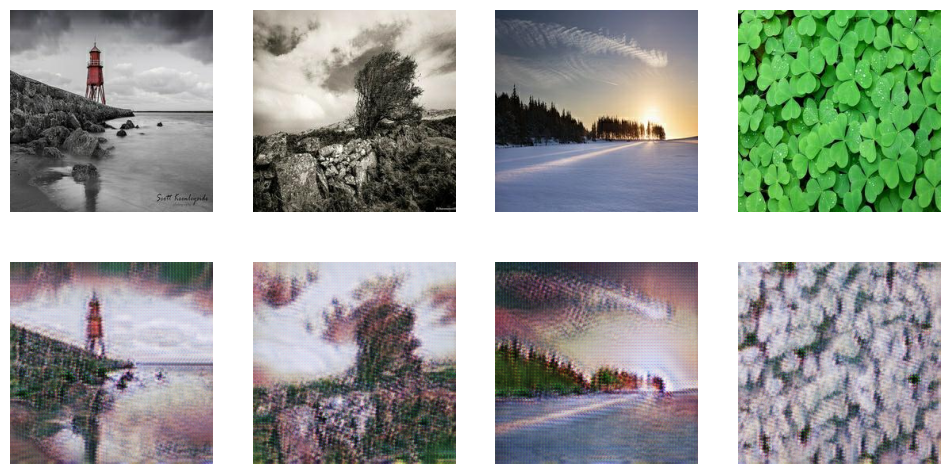

Epoch [81/100] - loss_G_Photo2Monet: 0.0665, loss_G_Monet2Photo: 1.3317, loss_D_Photo: 0.0094, loss_D_Monet: 0.1924
Epoch [82/100] - loss_G_Photo2Monet: 0.0693, loss_G_Monet2Photo: 1.3343, loss_D_Photo: 0.0095, loss_D_Monet: 0.1940
Epoch [83/100] - loss_G_Photo2Monet: 0.0684, loss_G_Monet2Photo: 1.3106, loss_D_Photo: 0.0097, loss_D_Monet: 0.1993
Epoch [84/100] - loss_G_Photo2Monet: 0.0668, loss_G_Monet2Photo: 1.3663, loss_D_Photo: 0.0095, loss_D_Monet: 0.1969
Epoch [85/100] - loss_G_Photo2Monet: 0.0649, loss_G_Monet2Photo: 1.2926, loss_D_Photo: 0.0098, loss_D_Monet: 0.2078
Epoch [86/100] - loss_G_Photo2Monet: 0.0676, loss_G_Monet2Photo: 1.3499, loss_D_Photo: 0.0093, loss_D_Monet: 0.2020
Epoch [87/100] - loss_G_Photo2Monet: 0.0661, loss_G_Monet2Photo: 1.3355, loss_D_Photo: 0.0095, loss_D_Monet: 0.2037
Epoch [88/100] - loss_G_Photo2Monet: 0.0643, loss_G_Monet2Photo: 1.3032, loss_D_Photo: 0.0093, loss_D_Monet: 0.2076
Epoch [89/100] - loss_G_Photo2Monet: 0.0675, loss_G_Monet2Photo: 1.2938,

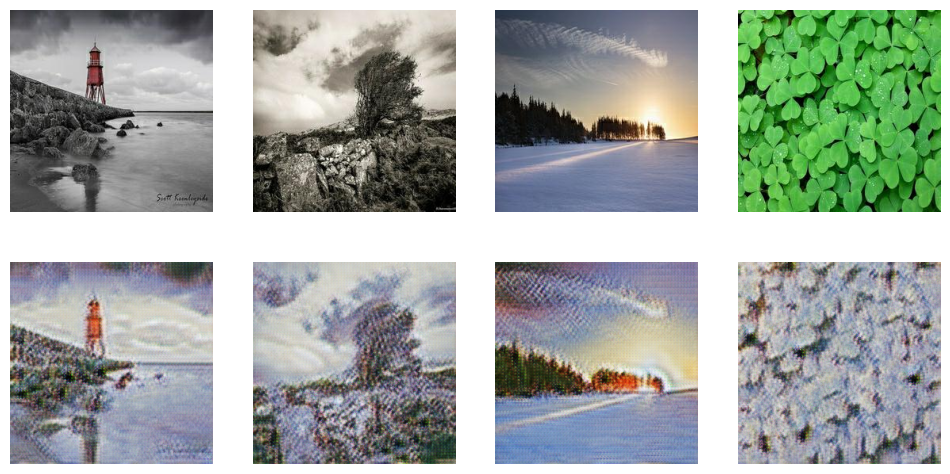

Epoch [91/100] - loss_G_Photo2Monet: 0.0689, loss_G_Monet2Photo: 1.3582, loss_D_Photo: 0.0096, loss_D_Monet: 0.2100
Epoch [92/100] - loss_G_Photo2Monet: 0.0704, loss_G_Monet2Photo: 1.3872, loss_D_Photo: 0.0092, loss_D_Monet: 0.2026
Epoch [93/100] - loss_G_Photo2Monet: 0.0654, loss_G_Monet2Photo: 1.3139, loss_D_Photo: 0.0099, loss_D_Monet: 0.2177
Epoch [94/100] - loss_G_Photo2Monet: 0.0655, loss_G_Monet2Photo: 1.3524, loss_D_Photo: 0.0093, loss_D_Monet: 0.1963
Epoch [95/100] - loss_G_Photo2Monet: 0.0678, loss_G_Monet2Photo: 1.2942, loss_D_Photo: 0.0095, loss_D_Monet: 0.2032
Epoch [96/100] - loss_G_Photo2Monet: 0.0656, loss_G_Monet2Photo: 1.3261, loss_D_Photo: 0.0093, loss_D_Monet: 0.1965
Epoch [97/100] - loss_G_Photo2Monet: 0.0655, loss_G_Monet2Photo: 1.2991, loss_D_Photo: 0.0091, loss_D_Monet: 0.2025
Epoch [98/100] - loss_G_Photo2Monet: 0.0654, loss_G_Monet2Photo: 1.2913, loss_D_Photo: 0.0095, loss_D_Monet: 0.2086
Epoch [99/100] - loss_G_Photo2Monet: 0.0655, loss_G_Monet2Photo: 1.3063,

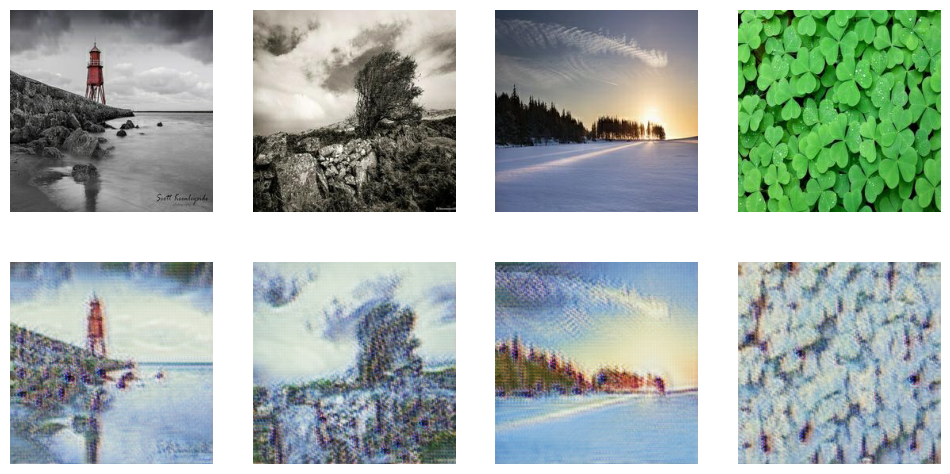

In [20]:
import torch
import torch.optim as optim
from torch.cuda.amp import GradScaler, autocast  # For mixed precision training
from tqdm import tqdm  # For progress bar during training

# Set device to GPU if available, else CPU
device = "cuda" if torch.cuda.is_available() else "cpu"

# Initialize generators and discriminators for the CycleGAN model
G_Photo2Monet = Generator(img_channels=3).to(device)  # Generator for Photo to Monet conversion
G_Monet2Photo = Generator(img_channels=3).to(device)  # Generator for Monet to Photo conversion
D_Photo = Discriminator(in_channels=3).to(device)  # Discriminator for distinguishing real vs fake photos
D_Monet = Discriminator(in_channels=3).to(device)  # Discriminator for distinguishing real vs fake Monet paintings

# Initialize optimizers for both generators and discriminators
optimizer_G_Photo2Monet = optim.Adam(G_Photo2Monet.parameters(), lr=1e-4, betas=(0.5, 0.5))  # Adam optimizer for Photo2Monet generator
optimizer_G_Monet2Photo = optim.Adam(G_Monet2Photo.parameters(), lr=1e-4, betas=(0.5, 0.5))  # Adam optimizer for Monet2Photo generator
optimizer_D_Photo = optim.Adam(D_Photo.parameters(), lr=1e-4, betas=(0.5, 0.5))  # Adam optimizer for Photo discriminator
optimizer_D_Monet = optim.Adam(D_Monet.parameters(), lr=1e-4, betas=(0.5, 0.5))  # Adam optimizer for Monet discriminator

# Define loss functions: GAN loss (MSE) and cycle consistency loss (L1)
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

# Initialize a gradient scaler for mixed precision training
scaler = GradScaler()

# Set cycle consistency loss weight
lambda_cycle = 5

# Define number of epochs and batch size
num_epochs = 100
batch_size = 16

# Training loop
for epoch in range(num_epochs):
    epoch_loss_G_Photo2Monet = 0
    epoch_loss_G_Monet2Photo = 0
    epoch_loss_D_Photo = 0
    epoch_loss_D_Monet = 0

    # Iterate over batches of real photos and real Monet paintings
    for i, (real_photo, real_monet) in enumerate(zip(train_PhotoLoader, train_MonetLoader)):
        real_photo = real_photo.to(device)
        real_monet = real_monet.to(device)

        # Forward pass for generating fake images
        fake_monet = G_Photo2Monet(real_photo).detach()  # Generate fake Monet from real photo
        fake_photo = G_Monet2Photo(real_monet).detach()  # Generate fake photo from real Monet

        # Discriminator outputs for real images
        D_Photo_real = D_Photo(real_photo)
        D_Monet_real = D_Monet(real_monet)

        # Get the shapes of discriminator outputs
        D_Photo_output_shape = D_Photo_real.shape
        D_Monet_output_shape = D_Monet_real.shape

        # Create real and fake labels for discriminator loss calculation
        real_label_Photo = torch.ones(D_Photo_output_shape, dtype=torch.float, device=device)
        fake_label_Photo = torch.zeros(D_Photo_output_shape, dtype=torch.float, device=device)
        real_label_Monet = torch.ones(D_Monet_output_shape, dtype=torch.float, device=device)
        fake_label_Monet = torch.zeros(D_Monet_output_shape, dtype=torch.float, device=device)

        # ---- Discriminator Training ----
        with autocast():
            # Forward pass for real and fake images through the photo discriminator
            D_Photo_fake = D_Photo(fake_photo)
            loss_D_Photo_real = criterion_GAN(D_Photo_real, real_label_Photo)
            loss_D_Photo_fake = criterion_GAN(D_Photo_fake, fake_label_Photo)
            loss_D_Photo = (loss_D_Photo_real + loss_D_Photo_fake) * 0.5  # Average of real and fake loss

            # Forward pass for real and fake images through the Monet discriminator
            D_Monet_fake = D_Monet(fake_monet)
            loss_D_Monet_real = criterion_GAN(D_Monet_real, real_label_Monet)
            loss_D_Monet_fake = criterion_GAN(D_Monet_fake, fake_label_Monet)
            loss_D_Monet = (loss_D_Monet_real + loss_D_Monet_fake) * 0.5  # Average of real and fake loss

        # Backward pass for the Photo discriminator
        optimizer_D_Photo.zero_grad()  # Zero the gradients
        scaler.scale(loss_D_Photo).backward()  # Scale gradients for mixed precision
        scaler.step(optimizer_D_Photo)  # Step optimizer

        # Backward pass for the Monet discriminator
        optimizer_D_Monet.zero_grad()  # Zero the gradients
        scaler.scale(loss_D_Monet).backward()  # Scale gradients for mixed precision
        scaler.step(optimizer_D_Monet)  # Step optimizer

        # Update running loss values
        epoch_loss_D_Photo += loss_D_Photo.item()
        epoch_loss_D_Monet += loss_D_Monet.item()

        # ---- Generator Training ----
        with autocast():
            # Forward pass for generating fake images
            fake_monet = G_Photo2Monet(real_photo)
            fake_photo = G_Monet2Photo(real_monet)

            # Calculate GAN loss for both generators
            loss_GAN_Photo2Monet = criterion_GAN(D_Monet(fake_monet), real_label_Monet)  # Monet discriminator output for fake Monet
            loss_GAN_Monet2Photo = criterion_GAN(D_Photo(fake_photo), real_label_Photo)  # Photo discriminator output for fake photo

            # Cycle consistency loss (real photo -> fake Monet -> cycle back to real photo)
            cycle_photo = G_Monet2Photo(fake_monet)
            loss_cycle_photo = criterion_cycle(cycle_photo, real_photo)

            # Cycle consistency loss (real Monet -> fake photo -> cycle back to real Monet)
            cycle_monet = G_Photo2Monet(fake_photo)
            loss_cycle_monet = criterion_cycle(cycle_monet, real_monet)

            # Final generator losses
            loss_G_Photo2Monet = loss_GAN_Photo2Monet + lambda_cycle * loss_cycle_photo
            loss_G_Monet2Photo = loss_GAN_Monet2Photo + lambda_cycle * loss_cycle_monet

        # Backward pass for the Photo2Monet generator
        optimizer_G_Photo2Monet.zero_grad()  # Zero the gradients
        scaler.scale(loss_G_Photo2Monet).backward()  # Scale gradients for mixed precision
        scaler.step(optimizer_G_Photo2Monet)  # Step optimizer

        # Backward pass for the Monet2Photo generator
        optimizer_G_Monet2Photo.zero_grad()  # Zero the gradients
        scaler.scale(loss_G_Monet2Photo).backward()  # Scale gradients for mixed precision
        scaler.step(optimizer_G_Monet2Photo)  # Step optimizer

        # Update the scaler for mixed precision
        scaler.update()

        # Update running loss values
        epoch_loss_G_Photo2Monet += loss_G_Photo2Monet.item()
        epoch_loss_G_Monet2Photo += loss_G_Monet2Photo.item()

    # Average the losses for this epoch
    epoch_loss_G_Photo2Monet /= len(train_PhotoLoader)
    epoch_loss_G_Monet2Photo /= len(train_MonetLoader)
    epoch_loss_D_Photo /= len(train_PhotoLoader)
    epoch_loss_D_Monet /= len(train_MonetLoader)

    # Print the losses at the end of each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}] - "
          f"loss_G_Photo2Monet: {epoch_loss_G_Photo2Monet:.4f}, "
          f"loss_G_Monet2Photo: {epoch_loss_G_Monet2Photo:.4f}, "
          f"loss_D_Photo: {epoch_loss_D_Photo:.4f}, "
          f"loss_D_Monet: {epoch_loss_D_Monet:.4f}")

    # Save and visualize the generated images every 10 epochs
    if (epoch + 1) % 10 == 0:
        with torch.no_grad():
            G_Photo2Monet.eval()  # Set generator to evaluation mode
            example_photo = next(iter(val_PhotoLoader)).to(device)  # Get a batch from validation set
            fake_monet = G_Photo2Monet(example_photo)  # Generate fake Monet images

            # Plot the real photos and their corresponding generated Monet images
            plt.figure(figsize=(12, 6))
            for i in range(4):
                plt.subplot(2, 4, i + 1)
                plt.imshow(((example_photo[i].cpu().numpy().transpose(1, 2, 0) + 1) / 2))  # Real photo
                plt.axis('off')
                plt.subplot(2, 4, i + 5)
                plt.imshow(((fake_monet[i].cpu().numpy().transpose(1, 2, 0) + 1) / 2))  # Fake Monet
                plt.axis('off')
            plt.show()

            G_Photo2Monet.train()  # Set generator back to training mode

# Save the final model and optimizer states
final_model_path = 'final_model.pth'
torch.save({
    'G_Photo2Monet': G_Photo2Monet.state_dict(),
    'G_Monet2Photo': G_Monet2Photo.state_dict(),
    'D_Photo': D_Photo.state_dict(),
    'D_Monet': D_Monet.state_dict(),
    'optimizer_G_Photo2Monet': optimizer_G_Photo2Monet.state_dict(),
    'optimizer_G_Monet2Photo': optimizer_G_Monet2Photo.state_dict(),
    'optimizer_D_Photo': optimizer_D_Photo.state_dict(),
    'optimizer_D_Monet': optimizer_D_Monet.state_dict(),
}, final_model_path)

In [21]:
import shutil
from zipfile import ZipFile

device = "cuda" if torch.cuda.is_available() else "cpu"
model_path = '/kaggle/working/final_model.pth'
checkpoint = torch.load(model_path)


G_Photo2Monet = Generator(img_channels=3).to(device)
G_Photo2Monet.load_state_dict(checkpoint['G_Photo2Monet'])
G_Photo2Monet.eval()

test_loader = DataLoader(PhotoDataset, batch_size=1, shuffle=False)


os.makedirs('../tmp/images', exist_ok=True)

with torch.no_grad():
    for i, img in enumerate(test_loader):
        img = img.to(device)
        fake_monet = G_Photo2Monet(img)[0].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
        im = Image.fromarray((fake_monet * 255).astype(np.uint8))
        im.save(f"../tmp/images/{i}.jpg")

output_zip_path = "/kaggle/working/images.zip"
with ZipFile(output_zip_path, 'w') as zipf:
    for root, _, files in os.walk('../tmp/images'):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), '../tmp/images'))
